In [20]:
import requests
from IPython import display
from base64 import b64decode
import io
from PIL import Image
from ipywidgets import interact
import time

In [21]:
# baseUrl = "https://p882bl70hqiua5-64410b71-3000.proxy.runpod.io/"
baseUrl = "http://localhost:7860/"

In [4]:
%%time
# This is just to put all the models into memory

for model in requests.get(f'{baseUrl}sdapi/v1/sd-models').json():
    requests.post(f'{baseUrl}sdapi/v1/sd-models', json={"name": model['model_name']}).json()

CPU times: total: 15.6 ms
Wall time: 2min 21s


In [39]:
styles = [r['name'] for r in requests.get(f'{baseUrl}sdapi/v1/prompt-styles').json()]

In [37]:
# User can select a vial and then will prompted with the type of vials they can use

vial_type = None
def myfunction(_vial_type): 
    global vial_type
    vial_type = _vial_type
interact(myfunction, _vial_type=["", 'collection', 'concept'])

interactive(children=(Dropdown(description='_vial_type', options=('', 'collection', 'concept'), value=''), Out…

<function __main__.myfunction(_vial_type)>

In [40]:
style = None
def myfunction(_style): 
    global style
    style = _style
    
if vial_type:
    interact(myfunction, _style=[s for s in styles if vial_type in s]);

interactive(children=(Dropdown(description='_style', options=('cal-art-concept', 'flat-design-concept', '3d-re…

In [8]:
if style is None or style == 'None' or style == '':
    style = ""
    collage = None
else:
    url = f'{baseUrl}file=vial_images/{vial_type}s/{style}.png'
    r = requests.get(url)
    imageStream = io.BytesIO(r.content)
    collage = Image.open(imageStream)

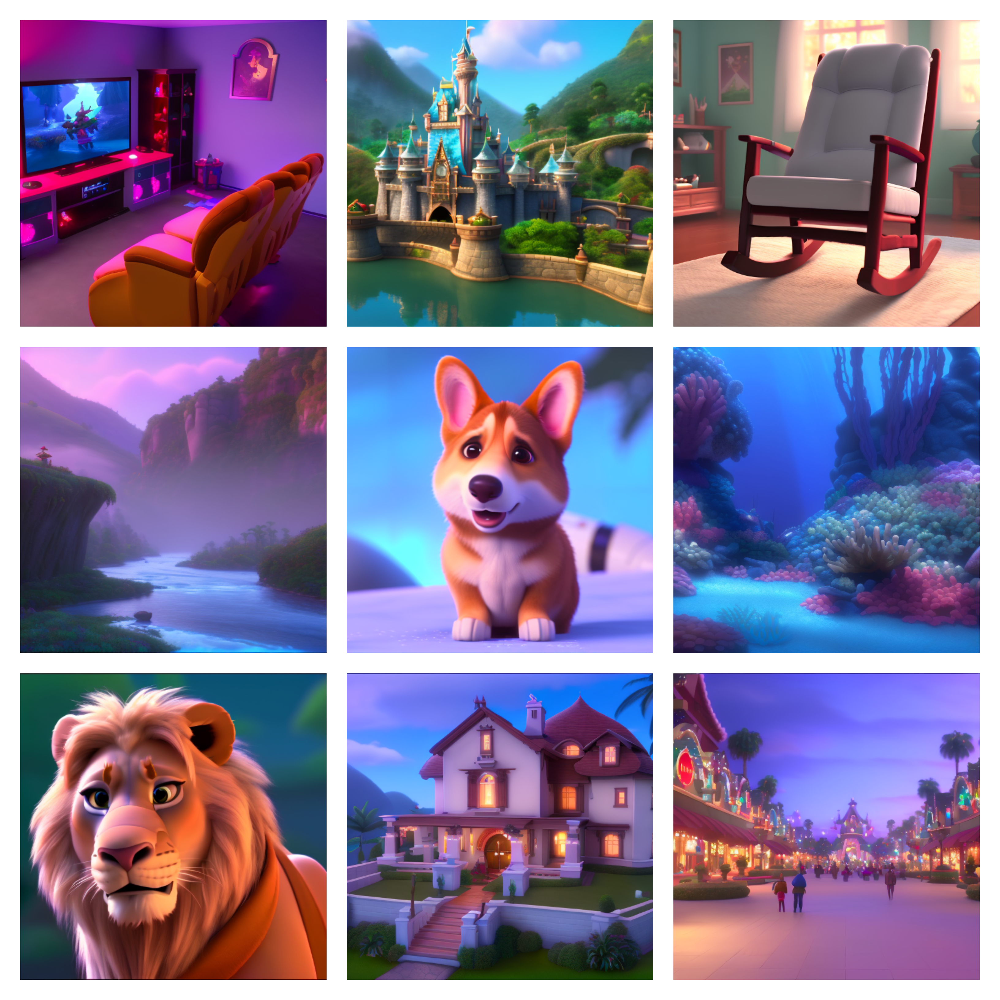

In [9]:
collage

In [142]:
# Call txt2img

prompt = "a corgi"

data = {
  "prompt": prompt,
  "style": style
}
r_txt2img = requests.post(f'{baseUrl}sdapi/v1/txt2imgLab', json=data).json()

In [143]:
r_txt2img

{'job_hash': 'f9192b78-bcf4-44dd-aa56-399880dfa982',
 'job_no': 1,
 'job_count': 2}

In [144]:
## Check Progress

def check_progress(r):
    url = f'{baseUrl}sdapi/v1/progress?skip_current_image=true&job_no={r_txt2img["job_no"]}'
    progress = requests.get(url).json()

    while progress['state']['job_no'] <= r['job_no']:
        print(progress)
        # If same job number but different hash then your done
        if progress['state']['job_no'] == r['job_no'] and progress['state']['job'] != r['job_hash']:
            break

        # If job number and job count are 0 then all jobs are done
        if progress['state']['job_no'] == 0 and progress['state']['job_count'] == 0:
            break

        progress = requests.get(url).json()
        time.sleep(2)

In [147]:
check_progress(r_txt2img)

{'progress': 0.0, 'eta_relative': 0.0, 'state': {'skipped': False, 'interrupted': False, 'job': '', 'job_count': 0, 'job_no': 0, 'sampling_step': 0, 'sampling_steps': 0}, 'current_image': None}


In [ ]:
## Get images in saved file (images are strings of bytes seperated by newline)

r_images_64 = requests.get(f'{baseUrl}file=outputs/api_imgs/{r_txt2img["job_hash"]}.txt')
txt2img_images_64 = r_images_64.content.split(b'\n')

In [ ]:
display.display(display.Image(b64decode(txt2img_images_64[0])))

In [16]:
# img2img

data = {
  "image": txt2img_images_64[0].decode(),
  "prompt": prompt,
  "style": style,
  "vial": "vary"
}
r_img2img = requests.post(f'{baseUrl}sdapi/v1/img2imgLab', json=data).json()

In [17]:
check_progress(r_img2img)

{'progress': 1.0, 'eta_relative': -259.05924053598363, 'state': {'skipped': False, 'interrupted': False, 'job': 'c240922f-79e3-4dd1-a814-cc7abe24160c', 'job_count': 2, 'job_no': 11, 'sampling_step': 1, 'sampling_steps': 38}, 'current_image': None}
{'progress': 1.0, 'eta_relative': -261.25915493779706, 'state': {'skipped': False, 'interrupted': False, 'job': 'c240922f-79e3-4dd1-a814-cc7abe24160c', 'job_count': 2, 'job_no': 11, 'sampling_step': 5, 'sampling_steps': 38}, 'current_image': None}
{'progress': 1.0, 'eta_relative': -265.90843946491384, 'state': {'skipped': False, 'interrupted': False, 'job': 'c240922f-79e3-4dd1-a814-cc7abe24160c', 'job_count': 2, 'job_no': 11, 'sampling_step': 15, 'sampling_steps': 38}, 'current_image': None}
{'progress': 1.0, 'eta_relative': -270.4046630239043, 'state': {'skipped': False, 'interrupted': False, 'job': 'c240922f-79e3-4dd1-a814-cc7abe24160c', 'job_count': 2, 'job_no': 11, 'sampling_step': 24, 'sampling_steps': 38}, 'current_image': None}
{'progr

In [18]:
r_images_64 = requests.get(f'{baseUrl}file=outputs/api_imgs/{r_img2img["job_hash"]}.txt')
img2img_images_64 = r_images_64.content.split(b'\n')

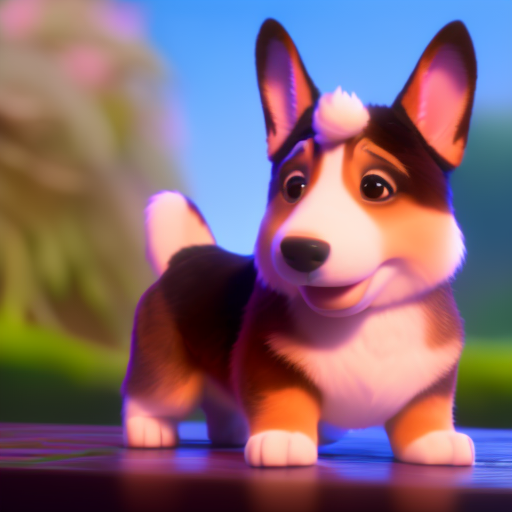

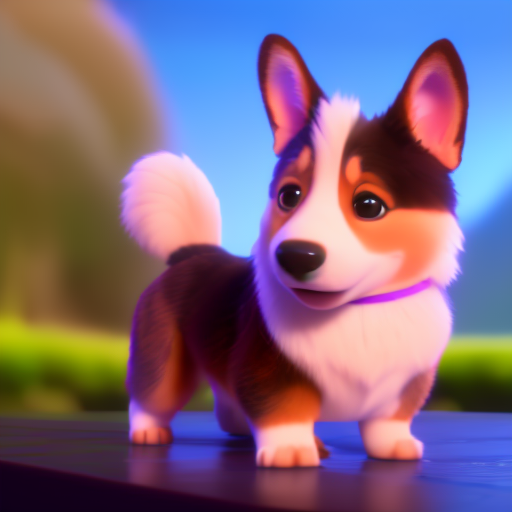

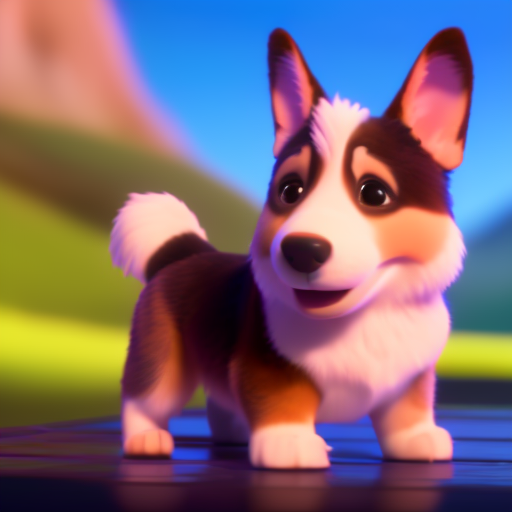

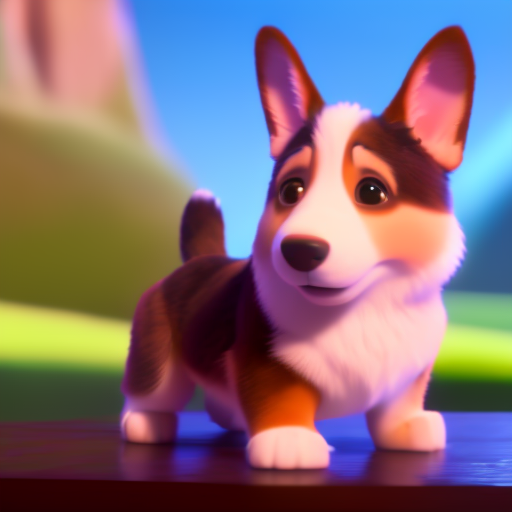

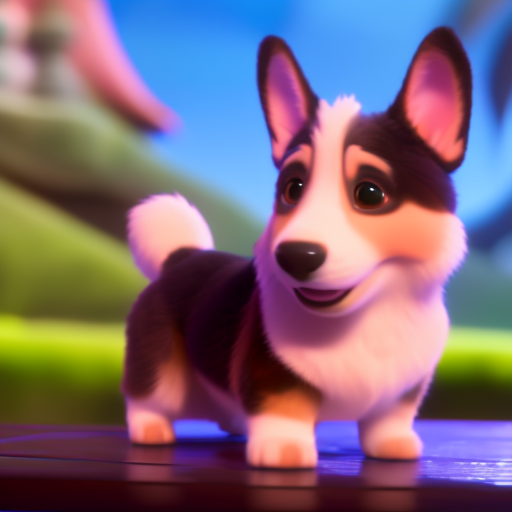

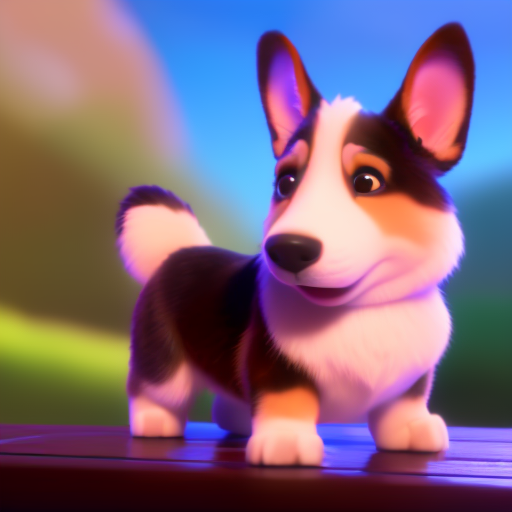

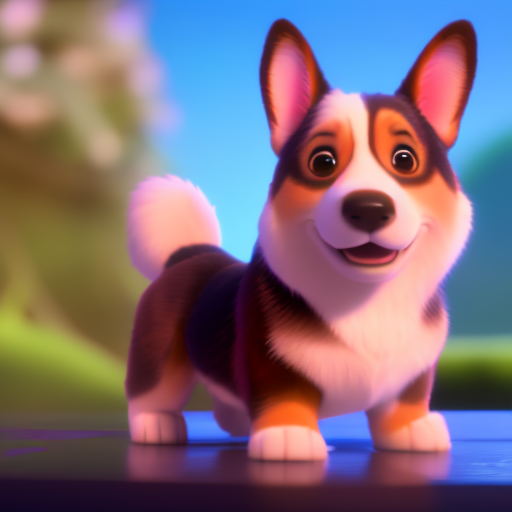

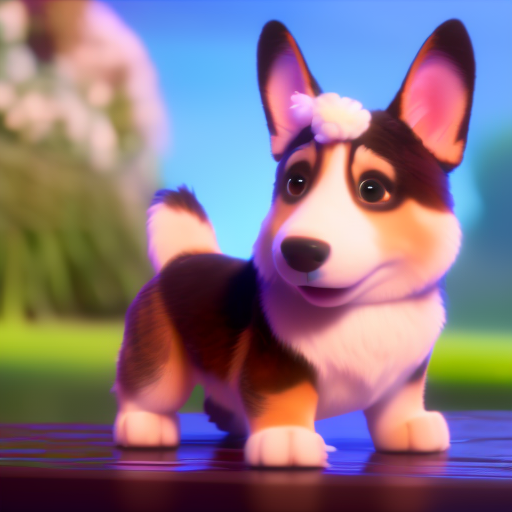

In [19]:
for i in img2img_images_64:
    display.display(display.Image(b64decode(i)))